In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score

In [2]:
df = pd.read_csv("C:\\Users\\user\\Desktop\\train.csv")

In [3]:
df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
6126,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


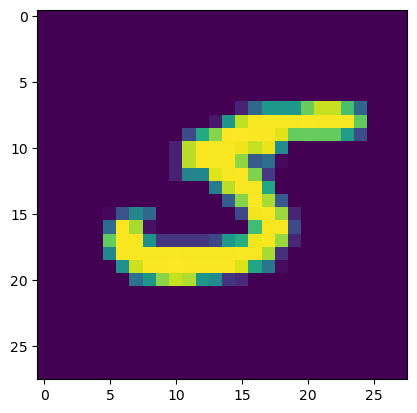

In [5]:
import matplotlib.pyplot as plt
plt.imshow(df.iloc[3254,1:].values.reshape(28,28))

In [6]:
x = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=1)

In [8]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

In [9]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [10]:
import time
start = time.time()
y_pred = knn.predict(x_test)
print(time.time()-start)
# because it is test dataset it is smaller one

12.242797136306763


In [11]:
accuracy_score(y_test,y_pred)

0.9671428571428572

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [13]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [15]:
X_train_trf = pca.fit_transform(x_train)
X_test_trf = pca.transform(x_test)

In [16]:
X_train_trf.shape

(33600, 200)

In [17]:
knn = KNeighborsClassifier()
knn.fit(X_train_trf,y_train)
y_pred = knn.predict(X_test_trf)

In [18]:
accuracy_score(y_test,y_pred)

0.9513095238095238

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(x_train)
    X_test_trf = pca.transform(x_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

In [19]:
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(x_train)
X_test_trf = pca.transform(x_test)

In [20]:
X_train_trf

array([[ -6.55498368,  -3.90067346],
       [  1.49104034,  -0.56277498],
       [  5.48650648, -11.19820861],
       ...,
       [  2.55668482,   0.85317277],
       [ -6.92692892,  -1.95758006],
       [ -5.69203488,  -3.80059331]])

In [21]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [22]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(x_train)
X_test_trf = pca.transform(x_test)

In [23]:
X_train_trf

array([[ -6.55499001,  -3.9014592 ,   3.7037988 ],
       [  1.49100715,  -0.56289643,   0.98494776],
       [  5.48644972, -11.19728799,   2.86066718],
       ...,
       [  2.55667676,   0.85347824,   2.66715791],
       [ -6.92692116,  -1.95649233,   2.79493466],
       [ -5.69200573,  -3.80145362,   1.8664188 ]])

In [24]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [25]:
pca.explained_variance_
# Eigen values

array([40.75597528, 29.08811391, 26.66609104])

In [26]:
pca.components_.shape

(3, 784)

In [27]:
pca.explained_variance_ratio_

array([0.05772629, 0.04120007, 0.03776954])

In [28]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(x_train)
X_test_trf = pca.transform(x_test)
pca.explained_variance_.shape

(784,)

In [29]:
pca.components_.shape

(784, 784)

In [30]:
pca.explained_variance_ratio_

array([5.77262922e-02, 4.12000685e-02, 3.77695438e-02, 2.96207504e-02,
       2.55760656e-02, 2.24296023e-02, 1.95828184e-02, 1.76863615e-02,
       1.57282515e-02, 1.42738884e-02, 1.36707201e-02, 1.22320264e-02,
       1.14728085e-02, 1.11805154e-02, 1.05191342e-02, 1.01835039e-02,
       9.53843591e-03, 9.37370873e-03, 9.07503214e-03, 8.89845836e-03,
       8.40783418e-03, 8.14627115e-03, 7.78134548e-03, 7.56719359e-03,
       7.29590530e-03, 7.00257145e-03, 6.91538691e-03, 6.68190243e-03,
       6.33520940e-03, 6.15956763e-03, 6.07288305e-03, 6.00491068e-03,
       5.76573760e-03, 5.73815033e-03, 5.64835407e-03, 5.49763479e-03,
       5.41604229e-03, 5.26292624e-03, 5.04508394e-03, 4.90831561e-03,
       4.87321197e-03, 4.76499472e-03, 4.63662683e-03, 4.59117250e-03,
       4.53999214e-03, 4.48192247e-03, 4.43203299e-03, 4.37548083e-03,
       4.32156207e-03, 4.30178075e-03, 4.22689926e-03, 4.14683096e-03,
       4.08731306e-03, 4.00393603e-03, 3.97233536e-03, 3.91617947e-03,
      

In [31]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05772629, 0.09892636, 0.1366959 , 0.16631665, 0.19189272,
       0.21432232, 0.23390514, 0.2515915 , 0.26731975, 0.28159364,
       0.29526436, 0.30749639, 0.3189692 , 0.33014971, 0.34066885,
       0.35085235, 0.36039079, 0.3697645 , 0.37883953, 0.38773799,
       0.39614582, 0.40429209, 0.41207344, 0.41964063, 0.42693654,
       0.43393911, 0.44085449, 0.4475364 , 0.45387161, 0.46003117,
       0.46610406, 0.47210897, 0.47787471, 0.48361286, 0.48926121,
       0.49475884, 0.50017489, 0.50543781, 0.5104829 , 0.51539121,
       0.52026442, 0.52502942, 0.52966605, 0.53425722, 0.53879721,
       0.54327913, 0.54771117, 0.55208665, 0.55640821, 0.56070999,
       0.56493689, 0.56908372, 0.57317103, 0.57717497, 0.5811473 ,
       0.58506348, 0.58892089, 0.59274036, 0.59642296, 0.60008844,
       0.60368522, 0.6072144 , 0.61069911, 0.61414882, 0.61757117,
       0.62098573, 0.62436077, 0.62767585, 0.63094538, 0.63415873,
       0.63735435, 0.64053188, 0.64366798, 0.64676739, 0.64981

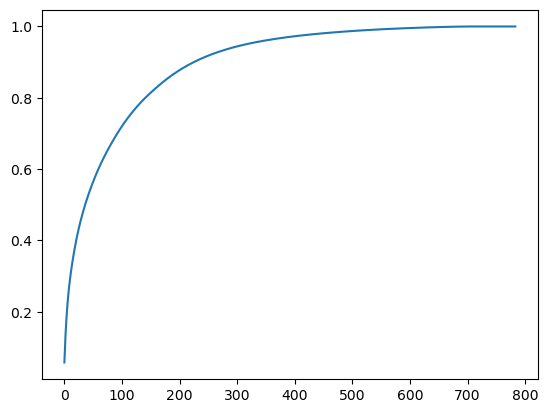

In [32]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))